## DAB103-Project-Phase01

In [ ]:
#%pip install dataprep

In [ ]:
#%pip install pandas
#%pip install numpy
#%pip install seaborn
#%pip install matplotlib
#%pip install researchpy
#%pip install scipy
#%pip install statsmodels
#%pip install dataprep
%pip install missingno

In [3]:
# importing necessary libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import researchpy as rp
import scipy.stats as stats
import statsmodels.api as sm
from statsmodels.formula.api import ols
from dataprep.eda import *
import plotly.express as px
import missingno as msno

In [4]:
#importing the dataset
direct_marketing = pd.read_csv('https://query.data.world/s/lqrsaugj7kwkyazkvydowjuxjrybxx', sep=';')

In [5]:
# New_Name a dictionary
# key = old name
# value = new name
dict = {'age': 'Age',
        'job': 'Job',
        'marital': 'Marital',
        'education': 'Education',
        'default' : 'Credit_default',
        'housing': 'Housing_loan',
        'loan' : 'Personal_loan',
        'contact' : 'Call_type',
        'month' : 'Last_month',
        'day_of_week': 'Last_weekday',
        'duration': 'LastCall_Dur',
        'campaign' : 'NewCampaign_CallNo',
        'pdays' : 'Campaign_Intervals_Day',
        'previous': 'PrevCampaign_CallNo',
        'poutcome' : 'PrevCampaign_result',
        'y' : 'Campaign_Success'      
       }

In [6]:
# call rename () method
direct_marketing.rename(columns=dict, inplace=True)

In [7]:
# print Data frame
direct_marketing.drop(columns= ['emp.var.rate','cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed'])
display(direct_marketing)

,Age,Job,Marital,Education,Credit_default,Housing_loan,Personal_loan,Call_type,Last_month,Last_weekday,...,NewCampaign_CallNo,Campaign_Intervals_Day,PrevCampaign_CallNo,PrevCampaign_result,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,Campaign_Success
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,73,retired,married,professional.course,no,yes,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes
41184,46,blue-collar,married,professional.course,no,no,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41185,56,retired,married,university.degree,no,yes,no,cellular,nov,fri,...,2,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41186,44,technician,married,professional.course,no,no,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes


In [8]:
#exploring the dataset
type (direct_marketing)
direct_marketing.shape
direct_marketing.head()
direct_marketing.tail()
direct_marketing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Age                     41188 non-null  int64  
 1   Job                     41188 non-null  object 
 2   Marital                 41188 non-null  object 
 3   Education               41188 non-null  object 
 4   Credit_default          41188 non-null  object 
 5   Housing_loan            41188 non-null  object 
 6   Personal_loan           41188 non-null  object 
 7   Call_type               41188 non-null  object 
 8   Last_month              41188 non-null  object 
 9   Last_weekday            41188 non-null  object 
 10  LastCall_Dur            41188 non-null  int64  
 11  NewCampaign_CallNo      41188 non-null  int64  
 12  Campaign_Intervals_Day  41188 non-null  int64  
 13  PrevCampaign_CallNo     41188 non-null  int64  
 14  PrevCampaign_result     41188 non-null

Text(0.5, 0, 'Variables')

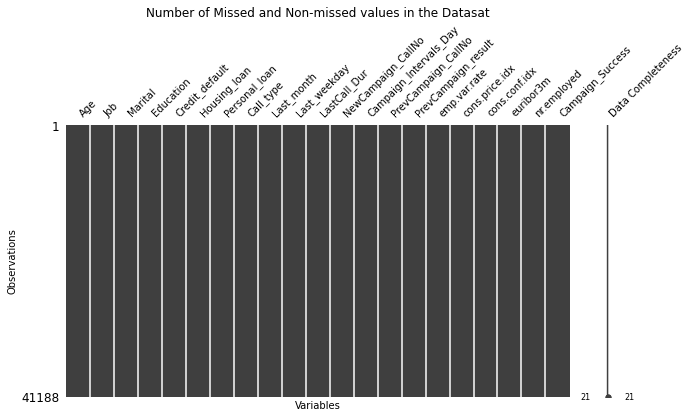

In [9]:
#exploring possible missing values 
#msno.bar(direct_marketing, figsize=(10, 5), fontsize=10, color='#FFC427', labels = True)
msno.matrix(direct_marketing, labels = True, fontsize = 10, figsize = (10, 5))
plt.title('Number of Missed and Non-missed values in the Datasat')
plt.ylabel('Observations')
plt.xlabel('Variables')

plotting the variables starting with numerical variables using px (plotly_express)


In [10]:
fig1 = px.histogram(direct_marketing["Age"], nbins=24, title='Age Distribution',
                   color_discrete_sequence=['#E31737']) #color is based on the theme of the presentation file
fig1.update_layout(xaxis_title_text='Age(years)',
    bargap=0.05, # gap between bars of adjacent location coordinates
    showlegend= False)
fig1.show()

In [11]:
fig2 = px.histogram(direct_marketing['LastCall_Dur'], 
                    nbins=100, title='Last Call Duration Distribution',
                   color_discrete_sequence=['#E31737'])
fig2.update_layout(xaxis_title_text='Last Call Duration (seconds)',
    bargap=0.05, # gap between bars of adjacent location coordinates
    showlegend= False)
fig2.show()

In [12]:
fig3 = px.histogram(direct_marketing['NewCampaign_CallNo'], 
                    nbins=60, title='Distribution of the times that a client has been contacted',
                   color_discrete_sequence=['#E31737'])
fig3.update_layout(xaxis_title_text='Frequency of client contact (times)',
    bargap=0.05, # gap between bars of adjacent location coordinates
    showlegend= False)
fig3.show()

In [13]:
fig4 = px.histogram(direct_marketing['Campaign_Intervals_Day'], 
                    nbins=60, title='Distribution of the days between the last two campaigns contact with clients',
                   color_discrete_sequence=['#E31737'])
fig4.update_layout(xaxis_title_text='Interval (days)',
    bargap=0.05, # gap between bars of adjacent location coordinates
    showlegend= False)
fig4.show()

In [14]:
fig5 = px.histogram(direct_marketing['PrevCampaign_CallNo'], 
                    nbins=60, title='Distribution of the number of the client calls during the last campign',
                   color_discrete_sequence=['#E31737'])
fig5.update_layout(xaxis_title_text='Number of times',
    bargap=0.05, # gap between bars of adjacent location coordinates
    showlegend= False)
fig5.show()

now starting to plot the categorical variables using plotly_express barchart


In [15]:
dm_job = pd.DataFrame(direct_marketing.groupby(['Job']).size()).reset_index() 
#creating a dataframe consisting of the variable and its count
dm_job = dm_job.rename(columns={0:'Count'}).sort_values('Count') 
#renaming the column to Count and sorting them

In [16]:
fig6 = px.bar(dm_job, x='Job', y='Count',
              color_discrete_sequence=['#009999'])
fig6.update_layout(xaxis_title_text='Jobs',
                   yaxis_title_text='Count',
                  title_text = 'Clients Jobs')
fig6.show()

In [17]:
dm_Marital = pd.DataFrame(direct_marketing.groupby(['Marital']).size()).reset_index() 
#creating a dataframe consisting of the variable and its count
dm_Marital = dm_Marital.rename(columns={0:'Count'}).sort_values('Count') 
#renaming the column to Count and sorting them

In [18]:
fig7 = px.bar(dm_Marital, x='Marital', y='Count',
              color_discrete_sequence=['#009999'])
fig7.update_layout(xaxis_title_text='Marital statuses of clients',
                   yaxis_title_text='Count',
                  title_text = 'Marital Status')
fig7.show()

In [19]:
dm_Education = pd.DataFrame(direct_marketing.groupby(['Education']).size()).reset_index() 
#creating a dataframe consisting of the variable and its count
dm_Education = dm_Education.rename(columns={0:'Count'}).sort_values('Count') 
#renaming the column to Count and sorting them

In [20]:
fig8 = px.bar(dm_Education, x='Education', y='Count',
              color_discrete_sequence=['#009999'])
fig8.update_layout(xaxis_title_text='Education statuses of clients',
                   yaxis_title_text='Count',
                  title_text = 'Education Status')
fig8.show()

In [21]:
dm_Credit = pd.DataFrame(direct_marketing.groupby(['Credit_default']).size()).reset_index() 
#creating a dataframe consisting of the variable and its count
dm_Credit = dm_Credit.rename(columns={0:'Count'}).sort_values('Count') 
#renaming the column to Count and sorting them

In [22]:
fig9 = px.bar(dm_Credit, x='Credit_default', y='Count',
              color_discrete_sequence=['#009999'])
fig9.update_layout(xaxis_title_text='Default credit history of clients',
                   yaxis_title_text='Count',
                  title_text = 'Default credit')
fig9.show()

In [23]:
dm_Housing_loan = pd.DataFrame(direct_marketing.groupby(['Housing_loan']).size()).reset_index() 
#creating a dataframe consisting of the variable and its count
dm_Housing_loan = dm_Housing_loan.rename(columns={0:'Count'}).sort_values('Count') 
#renaming the column to Count and sorting them

In [24]:
fig10 = px.bar(dm_Housing_loan, x='Housing_loan', y='Count',
              color_discrete_sequence=['#009999'])
fig10.update_layout(xaxis_title_text='Active house loan status of clients',
                   yaxis_title_text='Count',
                  title_text = 'Active house loan status')
fig10.show()

In [25]:
dm_Personal_loan = pd.DataFrame(direct_marketing.groupby(['Personal_loan']).size()).reset_index() 
#creating a dataframe consisting of the variable and its count
dm_Personal_loan = dm_Personal_loan.rename(columns={0:'Count'}).sort_values('Count') 
#renaming the column to Count and sorting them

In [26]:
fig11 = px.bar(dm_Personal_loan, x='Personal_loan', y='Count',
              color_discrete_sequence=['#009999'])
fig11.update_layout(xaxis_title_text='Active personal loan status of clients',
                   yaxis_title_text='Count',
                  title_text = 'Active personal loan status')
fig11.show()

In [27]:
dm_Call_type = pd.DataFrame(direct_marketing.groupby(['Call_type']).size()).reset_index() 
#creating a dataframe consisting of the variable and its count
dm_Call_type = dm_Call_type.rename(columns={0:'Count'}).sort_values('Count') 
#renaming the column to Count and sorting them

In [28]:
fig12 = px.bar(dm_Call_type, x='Call_type', y='Count',
              color_discrete_sequence=['#009999'])
fig12.update_layout(xaxis_title_text='Clients device type',
                   yaxis_title_text='Count',
                  title_text = 'Clients device type')
fig12.show()

In [29]:
dm_Last_month = pd.DataFrame(direct_marketing.groupby(['Last_month']).size()).reset_index() 
#creating a dataframe consisting of the variable and its count
dm_Last_month = dm_Last_month.rename(columns={0:'Count'}).sort_values('Count') 
#renaming the column to Count and sorting them

In [30]:
fig13 = px.bar(dm_Last_month, x='Last_month', y='Count',
              color_discrete_sequence=['#009999'])
fig13.update_layout(xaxis_title_text='Months of the last call of the Client',
                   yaxis_title_text='Count',
                  title_text = 'Last month')
fig13.show()

In [31]:
dm_Last_weekday = pd.DataFrame(direct_marketing.groupby(['Last_weekday']).size()).reset_index() 
#creating a dataframe consisting of the variable and its count
dm_Last_weekday = dm_Last_weekday.rename(columns={0:'Count'}).sort_values('Count') 
#renaming the column to Count and sorting them

In [32]:
fig14 = px.bar(dm_Last_weekday, x='Last_weekday', y='Count',
              color_discrete_sequence=['#009999'])
fig14.update_layout(xaxis_title_text='Week day of the last call of the Client',
                   yaxis_title_text='Count',
                  title_text = 'Last weekday')
fig14.show()

In [33]:
dm_PrCampaign_Result = pd.DataFrame(direct_marketing.groupby(['PrevCampaign_result']).size()).reset_index() 
#creating a dataframe consisting of the variable and its count
dm_PrCampaign_Result = dm_PrCampaign_Result.rename(columns={0:'Count'}).sort_values('Count') 
#renaming the column to Count and sorting them

In [34]:
fig15 = px.bar(dm_PrCampaign_Result, x='PrevCampaign_result', y='Count',
              color_discrete_sequence=['#009999'])
fig15.update_layout(xaxis_title_text='Previous campaign result of the contact with clients',
                   yaxis_title_text='Count',
                  title_text = 'The result of the previous campaign')
fig15.show()

In [35]:
dm_Campaign_Success = pd.DataFrame(direct_marketing.groupby(['Campaign_Success']).size()).reset_index() 
#creating a dataframe consisting of the variable and its count
dm_Campaign_Success = dm_Campaign_Success.rename(columns={0:'Count'}).sort_values('Count') 
#renaming the column to Count and sorting them

In [36]:
fig16 = px.bar(dm_Campaign_Success, x='Campaign_Success', y='Count',
              color_discrete_sequence=['#009999'])
fig16.update_layout(xaxis_title_text='The success for this campaign',
                   yaxis_title_text='Count',
                  title_text = 'The success status for the campaign')
fig16.show()

## DAB103-Project-Phase02

In [37]:
#calculating percentage of yes and no in 'Campaign_Success' variable in marital segments 
dm_marital_perc = pd.DataFrame(direct_marketing.groupby(['Marital','Campaign_Success']).size())
dm_marital_perc = 100 * dm_marital_perc/dm_marital_perc.groupby(level=0).sum()
dm_marital_perc = dm_marital_perc.rename(columns={0:'Percent'}).reset_index() 
#if reset_index() is not used, then 'Marital' becomes index and plot can not be drawn
dm_marital_perc = pd.DataFrame(dm_marital_perc)
dm_marital_perc

,Marital,Campaign_Success,Percent
0,divorced,no,89.679098
1,divorced,yes,10.320902
2,married,no,89.842747
3,married,yes,10.157253
4,single,no,85.995851
5,single,yes,14.004149
6,unknown,no,85.000000
7,unknown,yes,15.000000


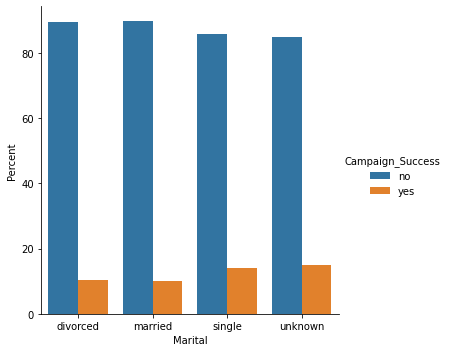

In [38]:
#testing sns.catplot for next plots
sns.catplot(data=dm_marital_perc,kind='bar',x='Marital' ,hue='Campaign_Success', y = 'Percent').set_titles("{col_name}")

In [39]:
# assigning an age group to each person based on his/her age
age_ranges = [15,30,45,65,100]
age_labels = ['Young','Adult','Mid-aged','Senior']
direct_marketing['Age_Group'] = pd.cut(direct_marketing['Age'], bins=age_ranges, labels=age_labels, right=False)


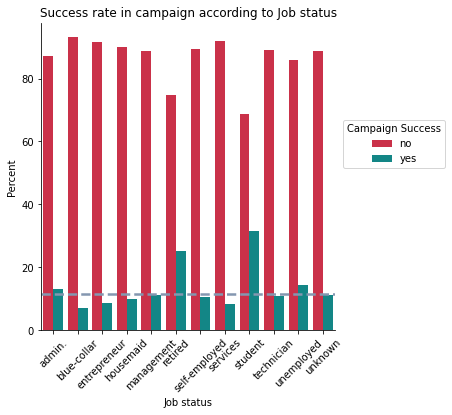

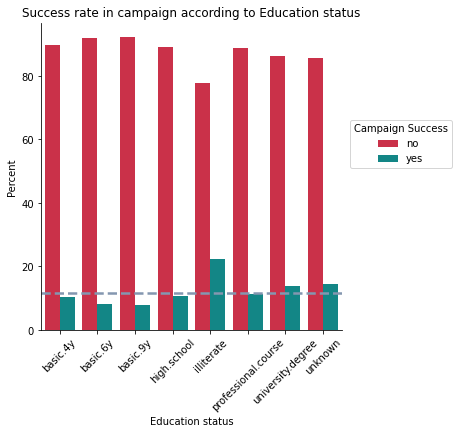

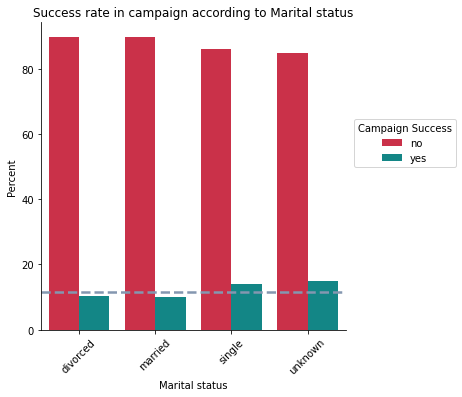

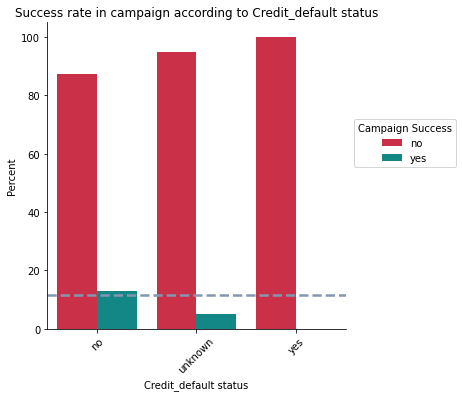

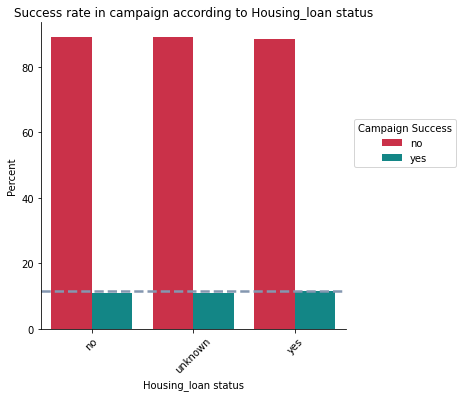

...

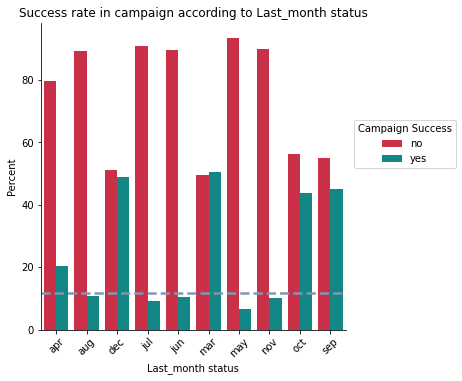

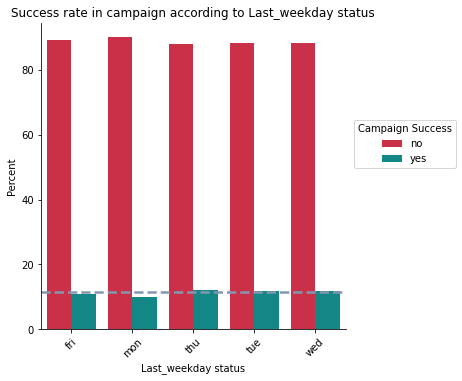

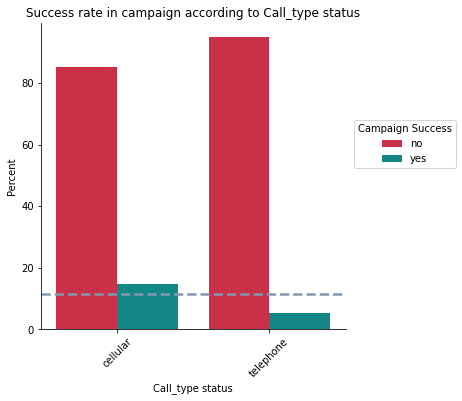

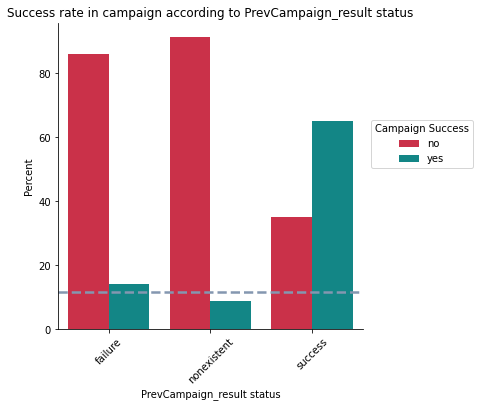

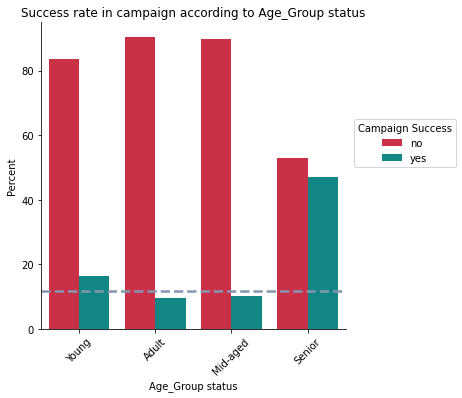

In [40]:
# adding all categorical variables into a list except the result variable, Campaign_Success
cat_var = ["Job", "Education", "Marital", "Credit_default", "Housing_loan", "Personal_loan",
            "Last_month", "Last_weekday", "Call_type" , "PrevCampaign_result", "Age_Group" ]
# the average success rate among targeted clients in this campaign was 11.625%
average_success_rate = 11.625
# plots colors according to the presentation palette
plot_colors = ['#E31737','#009999']
# repeating the percentage  plot for all categorical variables of the data frame
for i in cat_var:
    dm_perc = pd.DataFrame(direct_marketing.groupby([cat_var[cat_var.index(i)],'Campaign_Success']).size())
    dm_perc = 100 * dm_perc/dm_perc.groupby(level=0).sum()
    dm_perc = dm_perc.rename(columns={0:'Percent'}).reset_index()
    dm_perc = pd.DataFrame(dm_perc) #transforming dataframe to pecentage of campaign_success rate in each category
    sns.set_palette(sns.color_palette(plot_colors)) #using theme colors in plots
    g = sns.catplot(data=dm_perc,kind='bar',x=cat_var[cat_var.index(i)] ,
                    hue='Campaign_Success',y = 'Percent',
                   legend_out = False)
    g.map(plt.axhline, y=average_success_rate, lw = 2.5, ls='--', c='#8497B0') #plotting the horizontal line of overall success rate
    plt.title("Success rate in campaign according to {} status".format(cat_var[cat_var.index(i)]))
    plt.xlabel("{} status".format(cat_var[cat_var.index(i)]))
    plt.ylabel('Percent')
    plt.legend(bbox_to_anchor = (1.01,0.7), title = 'Campaign Success')
    plt.xticks(rotation=45)
    


In [41]:
#this figure is plotted after creating age groups based on age variable
dm_Age_Group = pd.DataFrame(direct_marketing.groupby(['Age_Group']).size()).reset_index() 
#creating a dataframe consisting of the variable and its count
dm_Age_Group = dm_Age_Group.rename(columns={0:'Count'}).sort_values('Count') 
#renaming the column to Count and sorting them

In [42]:
#this figure is plotted after creating age groups based on age variable
fig17 = px.bar(dm_Age_Group, x='Age_Group', y='Count',
              color_discrete_sequence=['#009999'])
fig17.update_layout(xaxis_title_text='Age Group',
                   yaxis_title_text='Count',
                  title_text = 'The age group status for the campaign')
fig17.show()

In [43]:
direct_marketing.head()

,Age,Job,Marital,Education,Credit_default,Housing_loan,Personal_loan,Call_type,Last_month,Last_weekday,...,Campaign_Intervals_Day,PrevCampaign_CallNo,PrevCampaign_result,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,Campaign_Success,Age_Group
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,Mid-aged
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,Mid-aged
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,Adult
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,Adult
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,Mid-aged


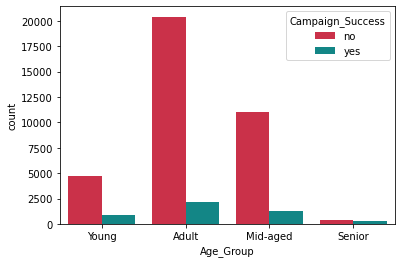

In [44]:
# exploring success rates in different categories of the categorical variables

sns.countplot(x = "Age_Group", hue = "Campaign_Success", data = direct_marketing)

plt.show()


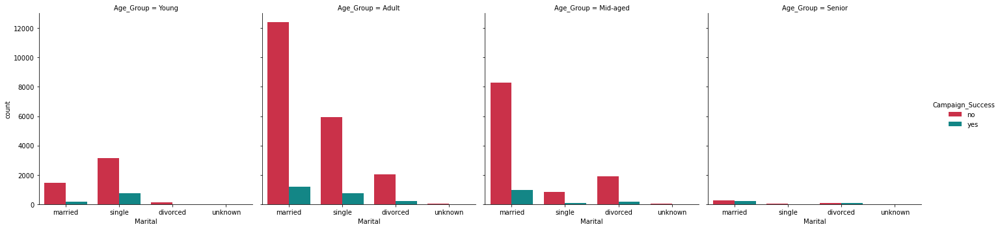

In [45]:
sns.catplot(x="Marital", hue="Campaign_Success", col="Age_Group",
                data=direct_marketing, kind="count")

C:\Users\meali\anaconda3\lib\site-packages\seaborn\axisgrid.py:409: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



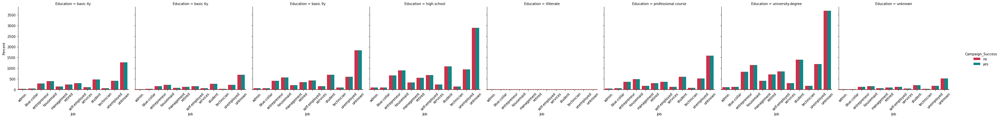

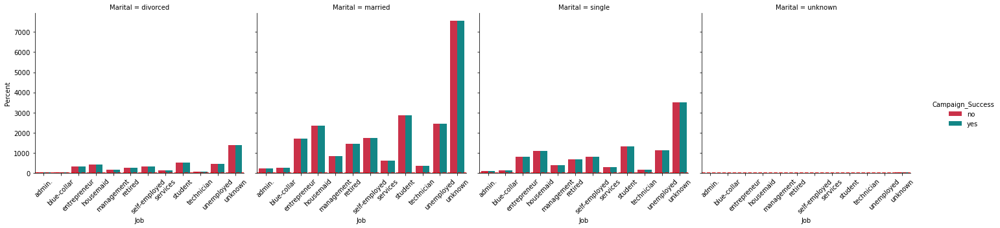

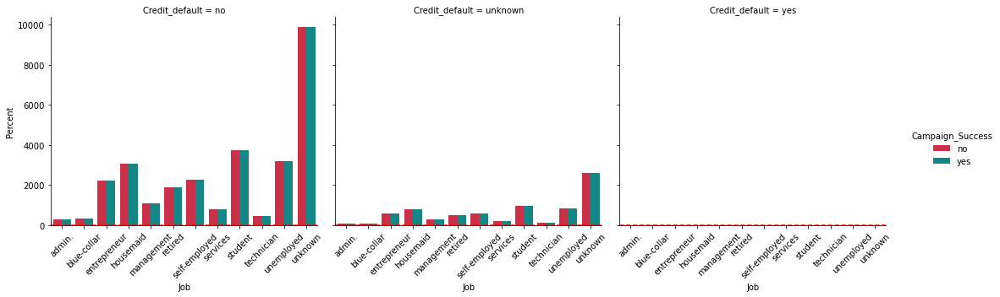

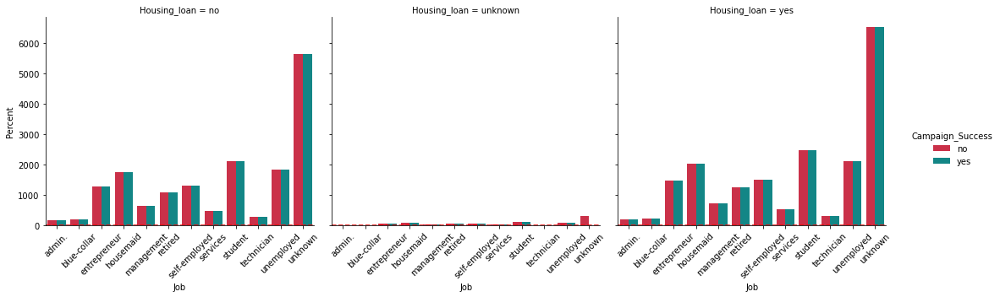

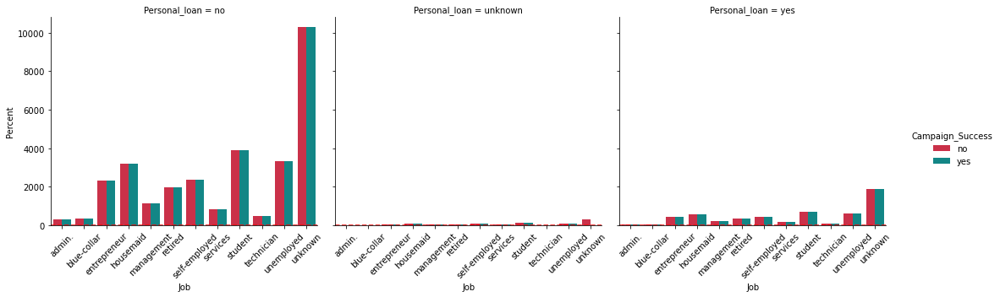

...

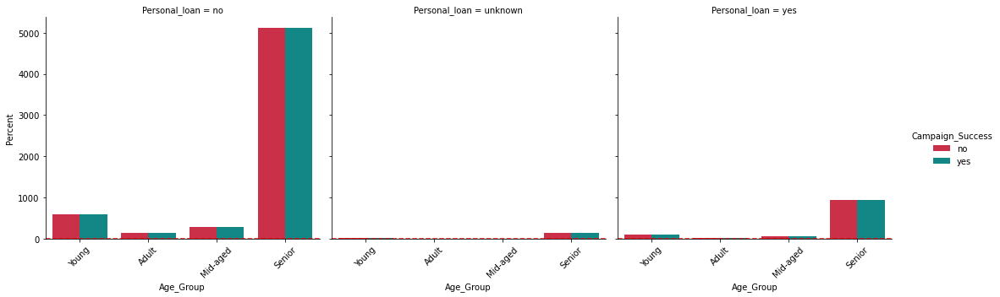

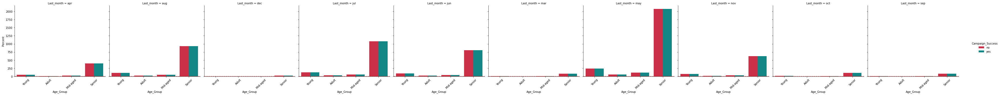

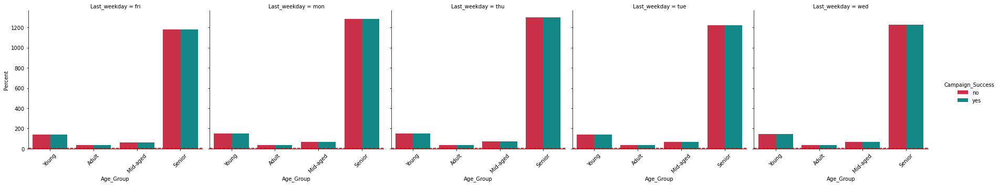

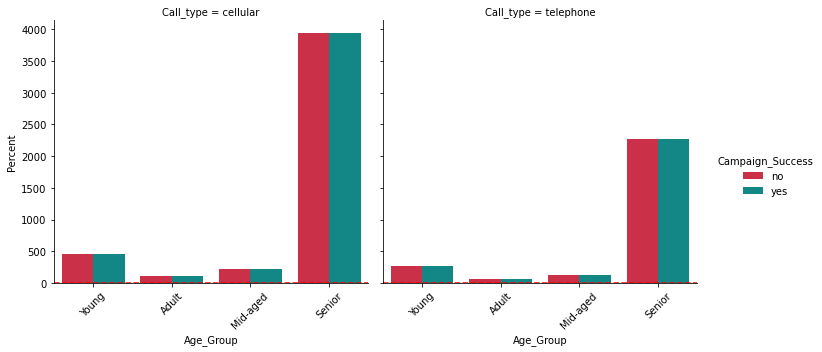

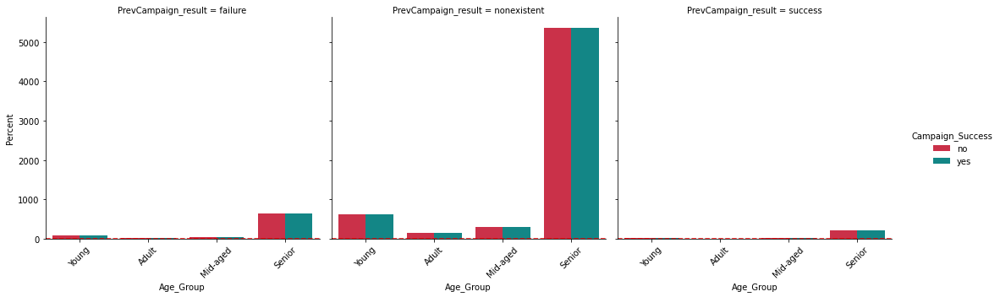

In [46]:
# repeating the percentage  plot for all categorical variables of the data frame
for i , j in enumerate(cat_var):
    for k , l in enumerate(cat_var) :
        if i == k:
            pass
        else:
            dm_perc = pd.DataFrame(direct_marketing.groupby([cat_var[k], cat_var[i],'Campaign_Success']).size())
            dm_perc = 100 * (dm_perc/dm_perc.groupby(level=1).sum())/(dm_perc/dm_perc.groupby(level=0).sum())
            dm_perc = dm_perc.rename(columns={0:'Percent'}).reset_index()
            dm_perc = pd.DataFrame(dm_perc)
            g = sns.catplot(data=dm_perc,kind='bar',x=cat_var[i] ,
                            hue='Campaign_Success', y = 'Percent', col = cat_var[k])
            g.set_xticklabels(rotation=45)
            g.map(plt.axhline, y=11.265/dm_perc[cat_var[i]].nunique(), ls='--', c='red')

In [47]:
#dropping unnecessary variables
direct_marketing = direct_marketing.drop(columns= ['emp.var.rate','cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed']) 
direct_marketing.head(1)

,Age,Job,Marital,Education,Credit_default,Housing_loan,Personal_loan,Call_type,Last_month,Last_weekday,LastCall_Dur,NewCampaign_CallNo,Campaign_Intervals_Day,PrevCampaign_CallNo,PrevCampaign_result,Campaign_Success,Age_Group
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,261,1,999,0,nonexistent,no,Mid-aged


In [54]:
# creating a list consisting numerical variables
num_var = ['PrevCampaign_CallNo', 'NewCampaign_CallNo', 'LastCall_Dur']   

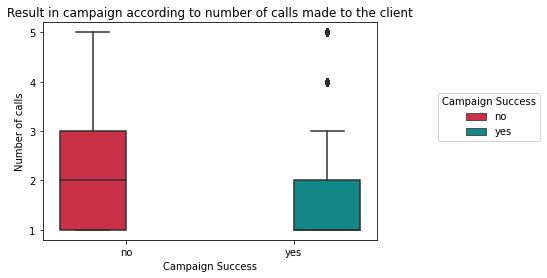

In [49]:
#plotting the NewCampaign_CallNo variable in a bloxplot
from matplotlib.ticker import MaxNLocator
#setting 1st and 3rd quartiles and calculating IQR
Q1 = direct_marketing['NewCampaign_CallNo'].quantile(0.25)
Q3 = direct_marketing['NewCampaign_CallNo'].quantile(0.75)
IQR = Q3 - Q1
#calculating whiskers
whis_low = (Q1 - 1.5 * IQR)
whis_high = (Q3 + 1.5 * IQR)
#filtering the outliers
direct_marketing_NewCampaign = direct_marketing.loc[direct_marketing['NewCampaign_CallNo']
                                                           > whis_low]
direct_marketing_NewCampaign = direct_marketing_NewCampaign.loc[direct_marketing_NewCampaign['NewCampaign_CallNo']
                                                                < whis_high]
h = sns.boxplot(x='Campaign_Success', y='NewCampaign_CallNo',
            hue='Campaign_Success',
            data=direct_marketing_NewCampaign)
#setting y axis values to be integers using imported MaxNLocator
h.yaxis.set_major_locator(MaxNLocator(integer = True))
#setting titles and legend
plt.title('Result in campaign according to number of calls made to the client')
plt.xlabel('Campaign Success')
plt.ylabel('Number of calls')
plt.legend(bbox_to_anchor = (1.5,0.7), title = 'Campaign Success')   

In [50]:
#new distribution of "NewCampaign_CallNo" variable
fig3_2 = px.histogram(direct_marketing_NewCampaign['NewCampaign_CallNo'], 
                    nbins=10, title='Distribution of the times that a client has been contacted',
                   color_discrete_sequence=['#E31737'])
fig3_2.update_layout(xaxis_title_text='Frequency of client contact (times)',
    bargap=0.05, # gap between bars of adjacent location coordinates
    showlegend= False)
fig3_2.show()

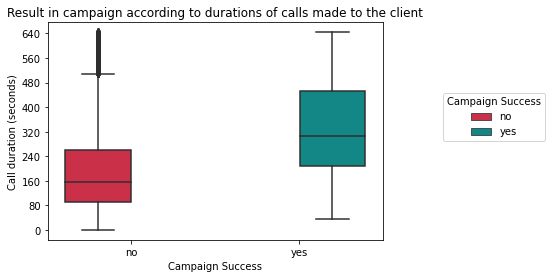

In [51]:
#plotting the LastCall_Dur variable in a bloxplot after data cleaning
from matplotlib.ticker import MaxNLocator
#setting 1st and 3rd quartiles and calculating IQR
Q1 = direct_marketing['LastCall_Dur'].quantile(0.25)
Q3 = direct_marketing['LastCall_Dur'].quantile(0.75)
IQR = Q3 - Q1
#calculating whiskers
whis_low = (Q1 - 1.5 * IQR)
whis_high = (Q3 + 1.5 * IQR)
#filtering the outliers
direct_marketing_LastCall_Dur = direct_marketing.loc[direct_marketing['LastCall_Dur'] > whis_low]
direct_marketing_LastCall_Dur = direct_marketing_LastCall_Dur.loc[direct_marketing_LastCall_Dur['LastCall_Dur'] < whis_high]
h = sns.boxplot(x='Campaign_Success', y='LastCall_Dur',
            hue='Campaign_Success',
            data=direct_marketing_LastCall_Dur)
#setting y axis values to be integers
h.yaxis.set_major_locator(MaxNLocator(integer = True))
#setting titles and legend
plt.title('Result in campaign according to durations of calls made to the client')
plt.xlabel('Campaign Success')
plt.ylabel('Call duration (seconds)')
plt.legend(bbox_to_anchor = (1.5,0.7), title = 'Campaign Success')   

In [52]:
#new distribution of "LastCall_Dur" variable after cleaning
fig2_2 = px.histogram(direct_marketing_LastCall_Dur['LastCall_Dur'], 
                    nbins=100, title='Last Call Duration Distribution',
                   color_discrete_sequence=['#E31737'])
fig2_2.update_layout(xaxis_title_text='Last Call Duration (seconds)',
    bargap=0.05, # gap between bars of adjacent location coordinates
    showlegend= False)
fig2_2.show()

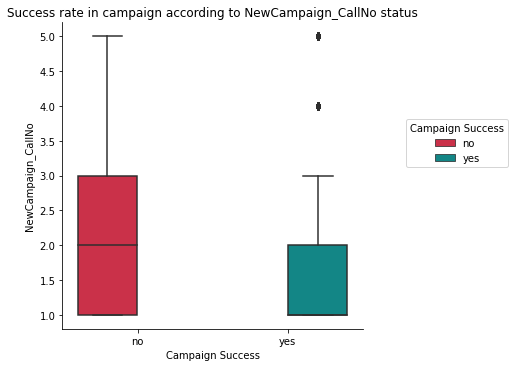

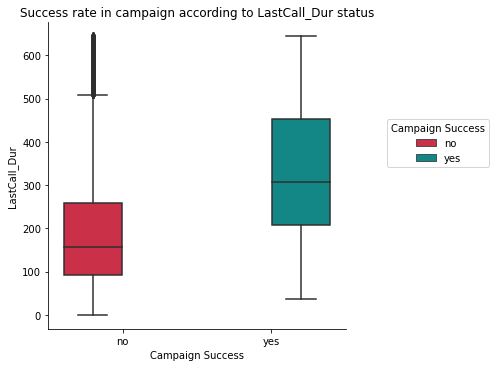

In [53]:
#repeating above plots in a for loop for numerical variables 
#we don't use this in presentation because the y axis label would be less understandable
for i in num_var[1:]:
    Q1 = direct_marketing[i].quantile(0.25)
    Q3 = direct_marketing[i].quantile(0.75)
    IQR = Q3 - Q1
    whis_low = (Q1 - 1.5 * IQR)
    whis_high = (Q3 + 1.5 * IQR)
    dm_num_var = direct_marketing.loc[direct_marketing[i] > whis_low]
    dm_num_var = dm_num_var.loc[dm_num_var[i] < whis_high]
    sns.catplot(data=dm_num_var,kind='box',x='Campaign_Success' ,hue='Campaign_Success',y = i)
    plt.title('Success rate in campaign according to {} status'.format(i))
    plt.xlabel('Campaign Success')
    plt.ylabel(i)
    plt.legend(bbox_to_anchor = (1.5,0.7), title = 'Campaign Success')   